### Task: Geospatial Analysis

Visualize the locations of restaurants on a map using latitude and longitude information.
Analyze the distribution of restaurant sacross different cities or countries.
Determine if there is any correlati onbetween the restaurant's location and i tsrating.

### Importing Libraries

In [4]:
# Importing the Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

### Importing Dataset

In [6]:
# Importing the required dataset
df = pd.read_csv('Dataset .csv')

In [7]:
# getting first five rows of the dataset
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


##### **Checking Number of Rows and Columns**

In [9]:
# Get number of rows and columns
rows, cols = df.shape
print(f"Number of rows: {rows}")
print(f"Number of columns: {cols}")

Number of rows: 9551
Number of columns: 21


##### **Check for Missing Values in Each Column and Handle Them Accordingly**

In [11]:
# Check for missing values in each column

missing_values = df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [12]:
# For categorical columns, you can either fill missing values with the mode (most frequent value) or drop them

df['Cuisines'].fillna(df['Cuisines'].mode()[0], inplace=True)

In [13]:
# Verify missing values after handling them

print("Missing values after handling:")
print(df.isnull().sum())

Missing values after handling:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


##### **Perform Data Type Conversion if Necessary**

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

Note - There is no need type Conversion.

**Visualize the Locations of Restaurants on a Map**

In [18]:
import folium

In [19]:
# Initialize a map centered around a mean latitude and longitude
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=10)

# Add markers for restaurants
for index, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']}, {row['City']}",
    ).add_to(restaurant_map)

# Save and display the map
restaurant_map.save("restaurant_map.html")
restaurant_map


#### **Analyze the Distribution of Restaurants Across Different Cities or Countries**

**a. Distribution of Restaurants by City**

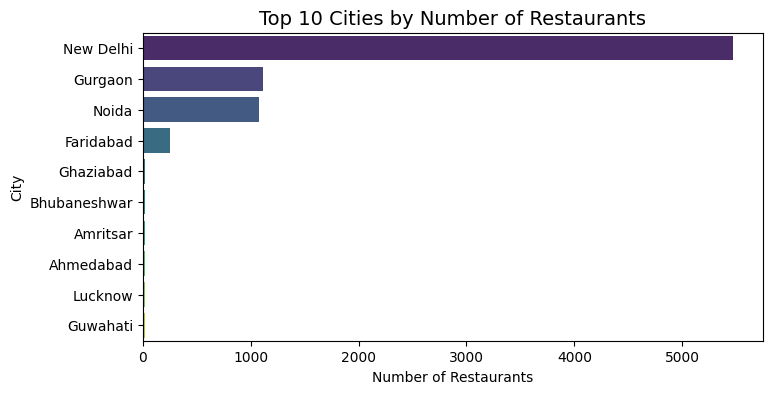

In [22]:
# Top 10 cities by the number of restaurants
top_cities = df['City'].value_counts().head(10)

# Plot the distribution
plt.figure(figsize=(8, 4))
sns.barplot(x=top_cities.values, y=top_cities.index, palette="viridis")
plt.title("Top 10 Cities by Number of Restaurants", fontsize=14)
plt.xlabel("Number of Restaurants")
plt.ylabel("City")
plt.show()


Note - From above graph we can see that, Delhi has top number of restaurants.
also Gurgaon, Noida, Faridabad, Ghaziabad, Bhubaneshwar, Amritsar, Ahmedabad, Lucknow, Guwahati has maximum restaurants.

**b. Distribution of Restaurants by Country**

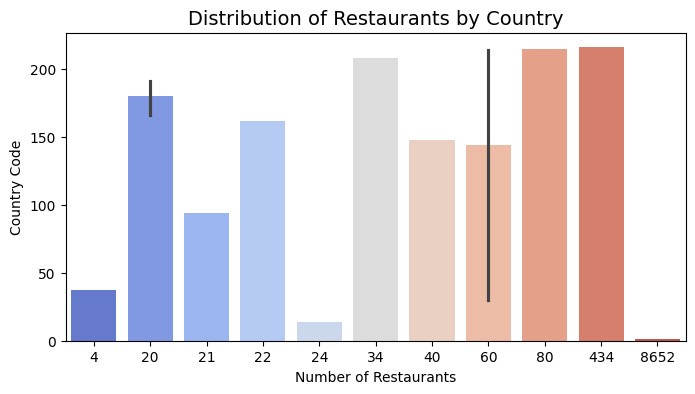

In [25]:
# Distribution of restaurants by country
country_distribution = df['Country Code'].value_counts()

# Plot
plt.figure(figsize=(8,4))
sns.barplot(x=country_distribution.values, y=country_distribution.index, palette="coolwarm")
plt.title("Distribution of Restaurants by Country", fontsize=14)
plt.xlabel("Number of Restaurants")
plt.ylabel("Country Code")
plt.show()


#### **Correlation Between Restaurant Location and Ratings**

**a. Correlation Calculation**

In [28]:
# Correlation matrix
correlation_matrix = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()
print("Correlation Matrix:\n", correlation_matrix)

Correlation Matrix:
                   Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


**b. Visualizing the Correlation**

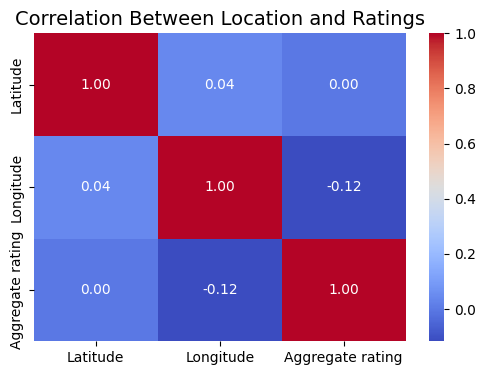

In [30]:
# Heatmap to visualize correlation
plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Between Location and Ratings", fontsize=14)
plt.show()

**c. Scatter Plot of Location vs Rating**

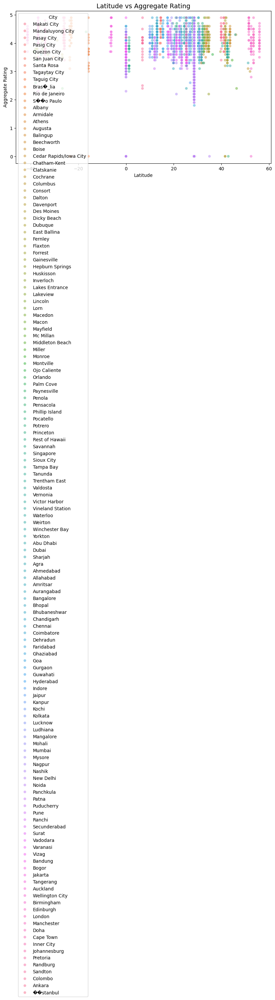

In [32]:
# Scatter plot to visualize latitude and ratings
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Latitude'], y=df['Aggregate rating'], alpha=0.5, hue=df['City'])
plt.title("Latitude vs Aggregate Rating", fontsize=14)
plt.xlabel("Latitude")
plt.ylabel("Aggregate Rating")
plt.show()

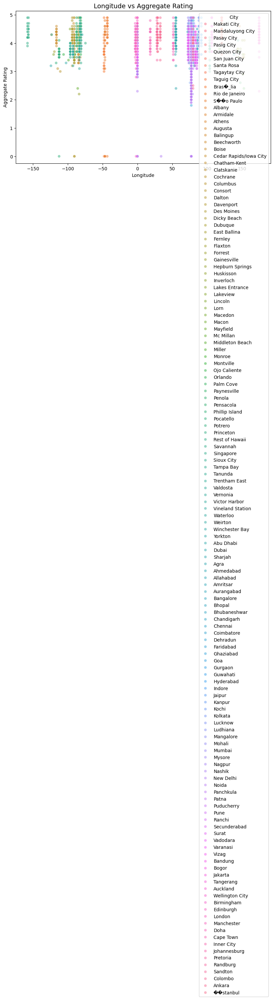

In [33]:
# Scatter plot to visualize longitude and ratings
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Longitude'], y=df['Aggregate rating'], alpha=0.5, hue=df['City'])
plt.title("Longitude vs Aggregate Rating", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Aggregate Rating")
plt.show()